# Data Visualizations for Airbnb Pirce in NYC

Data Source: [NYC Airbnb Price Dataset on Kaggle Platform](https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data) 

This dataset has around 49,000 observations with 16 columns.

**Main Steps**
- [Top Hosts Analysis](#Top-Hosts-Analysis)
- [Borough Analysis](#Borough-Analysis)
- [Neighbourhood Analysis](#Neighbourhood-Analysis)
- [Room Types Analysis](#Room-Types-Analysis)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

In [2]:
df = pd.read_csv("AB_NYC_2019.csv")
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [5]:
df.isnull().sum() # examine missing values

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [6]:
df.fillna({'reviews_per_month': 0}, inplace=True) # replace all missing values in 'reviews_per_month' column with 0

In [7]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

# Exploratory Data Analysis

Examine categorical unique values

In [8]:
df.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [9]:
df.neighbourhood.unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [10]:
df.neighbourhood.nunique()

221

In [11]:
df.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

# Top Hosts Analysis

In [12]:
top_host = df.host_id.value_counts().head(10)

top_host

219517861    327
107434423    232
30283594     121
137358866    103
12243051      96
16098958      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

We can see that first host has 327 listings.

In [13]:
df.calculated_host_listings_count.max() # confirm the number with the existing column 'calculated_host_listings_count'

327

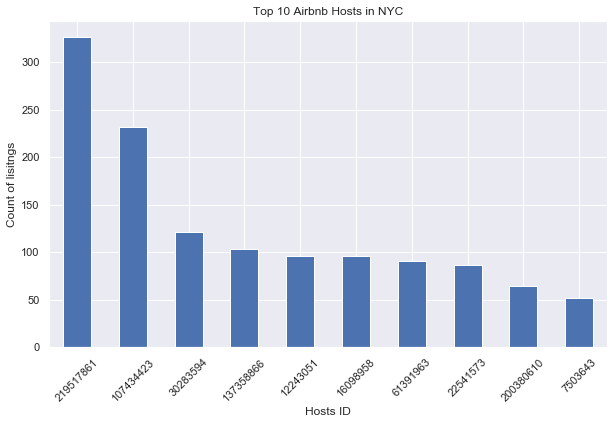

In [14]:
sns.set(rc={'figure.figsize':(10,6)})
plot1 = top_host.plot(kind='bar')
plot1.set_title('Top 10 Airbnb Hosts in NYC')
plot1.set_ylabel('Count of lisitngs')
plot1.set_xlabel('Hosts ID')
plot1.set_xticklabels(plot1.get_xticklabels(),rotation=45)
plot1

In [15]:
temp = df.host_id.value_counts().reset_index().head(10)
temp.columns = ['host_id', 'count']
temp = temp.merge(df[['host_id', 'host_name', 'latitude', 'longitude', 'price']], left_on = 'host_id', right_on = 'host_id', how = 'left')

fig1 = px.scatter_mapbox(temp,
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'host_name',
                        size = 'price',
#                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max = 15,
                        opacity = 0.9,
                        zoom = 10
                       )

fig1.layout.mapbox.style = 'carto-positron' # light gray map, good for point data
#"open-street-map", "carto-positron", "carto-darkmatter", "stamen-terrain", "stamen-toner" or "stamen-watercolor"

fig1.update_layout(title={
        'text': "Top 10 Hosts and their hosted locations",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig1.show()

We could see that Manhattan is the preferable place for top hosts.

# Borough Analysis

In [16]:
colors = ['gold', 'mediumturquoise', 'darkorange', 'lightgreen']
labels = df.neighbourhood_group.value_counts().index
values = df.neighbourhood_group.value_counts().values

# Use `hole` to create a donut-like pie chart
fig2 = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig2.update_traces(marker=dict(colors = colors, line=dict(color='#000000', width=2)))

fig2.update_layout(title={
        'text': "NYC Borough",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig2.show()

Manhattan and Brooklyn counts for most of the listings.

Text(0, 0.5, 'Price')

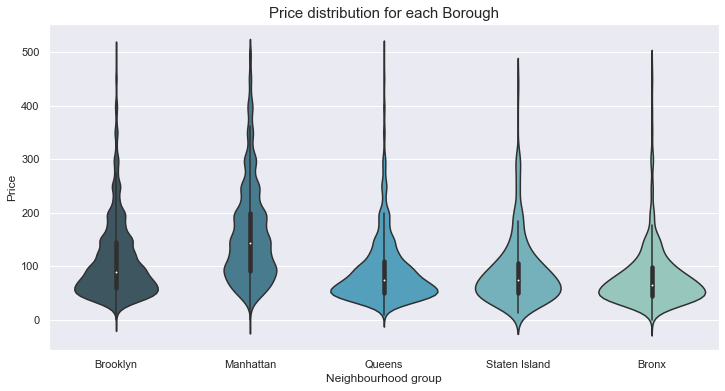

In [17]:
plt.figure(figsize=(12,6))
sns.violinplot(data=df[df.price <500], x='neighbourhood_group', y='price', palette='GnBu_d')
plt.title('Price distribution for each Borough', fontsize=15)
plt.xlabel('Neighbourhood group')
plt.ylabel("Price")

We could see that the price range of Manhattan listings is wide.

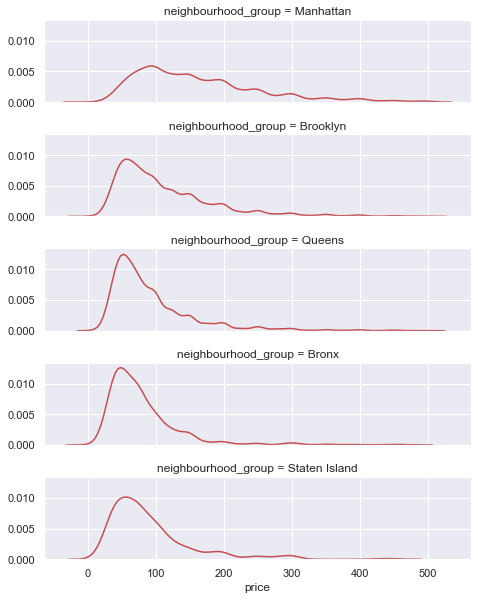

In [18]:
ordered_neighb = df.neighbourhood_group.value_counts().index
g = sns.FacetGrid(df[df.price<500], row="neighbourhood_group", row_order=ordered_neighb,
                  height=1.7, aspect=4,)
g.map(sns.distplot, "price", color = 'r', hist=False);

Manhattan is the most expensive region, while the Bronx region is the least expensive region.

# Neighbourhood Analysis

In [19]:
fig4 = px.scatter_mapbox(df,
                         hover_data = ['room_type', 'room_type', 'minimum_nights'],
                        lat = 'latitude',
                        lon = 'longitude',
                        color = 'neighbourhood',
                        size = 'price',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max = 15,
                        opacity = 0.9,
                        zoom = 10
                       )

fig4.layout.mapbox.style = 'stamen-terrain' # light gray map, good for point data
#"open-street-map", "carto-positron", "carto-darkmatter", "stamen-terrain", "stamen-toner" or "stamen-watercolor"

fig4.update_layout(title={
        'text': "NYC Airbnb by Neighbourhood",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig4.show()

# Room Types Analysis

Text(0, 0.5, 'Count')

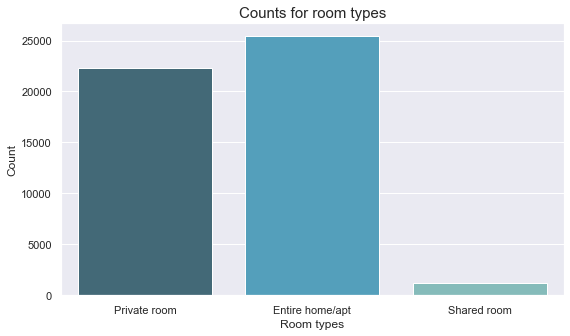

In [20]:
plt.figure(figsize=(9,5))
sns.countplot(data=df, x='room_type', palette='GnBu_d')
plt.title('Counts for room types', fontsize=15)
plt.xlabel('Room types')
plt.ylabel("Count")

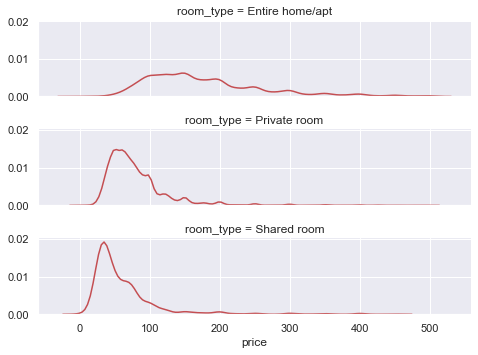

In [21]:
ordered_room = df.room_type.value_counts().index
g = sns.FacetGrid(df[df.price<500], row="room_type", row_order=ordered_room,
                  height=1.7, aspect=4,)
g.map(sns.distplot, "price", color = 'r', hist=False);

We could see that the 'entire room/apt' type is the most expensive, while the 'shared room' type is the least expensive.

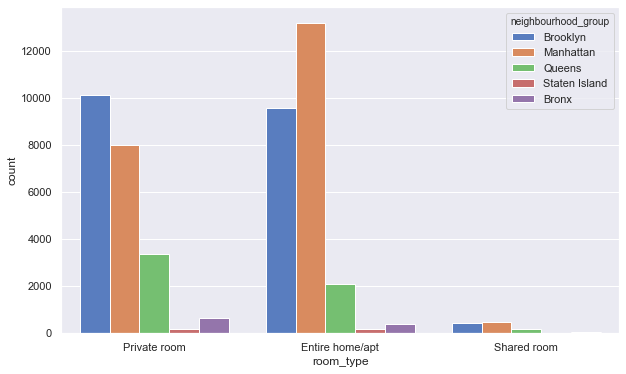

In [22]:
plt.figure(figsize=(10,6))
ax = sns.countplot(df['room_type'],hue=df['neighbourhood_group'], palette='muted')